# Imports

In [15]:
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.wcs import WCS
from photutils import CircularAperture, aperture_photometry
from photutils.aperture import CircularAnnulus, CircularAperture
from photutils.background import SExtractorBackground
from photutils.detection import DAOStarFinder
from photutils.utils import calc_total_error

# Read the Data

In [2]:
file_paths = ['masters/m34_B_master.fits',
              'masters/m34_V_master.fits',
              'masters/m37_B_master.fits',
              'masters/m37_V_master.fits']
filepath = file_paths[0]
header = fits.open(filepath)[0].header
data = fits.open(filepath)[0].data


# Background Estimation

In [3]:
mean, median, std = sigma_clipped_stats(data, sigma=3.0)
bkg_estimator = SExtractorBackground()
bkg = bkg_estimator(data)

# Source Detection

In [4]:
daofind = DAOStarFinder(fwhm=7, threshold=10*std) 
sources = daofind(data - bkg)  # subtracting the background
sources_df = sources.to_pandas()  # converting to pandas dataframe
positions = [list(a) for a in zip(sources["xcentroid"], sources["ycentroid"])]  # converting to list of tuples


# Aperture Photometry
## Create Aperture Object and Plot Detected Sources

Set OBSGEO-Y to -4721096.211 from OBSGEO-[LBH].
Set OBSGEO-Z to  4079367.987 from OBSGEO-[LBH]'. [astropy.wcs.wcs]


Text(0.5, 1.0, 'm34_B')

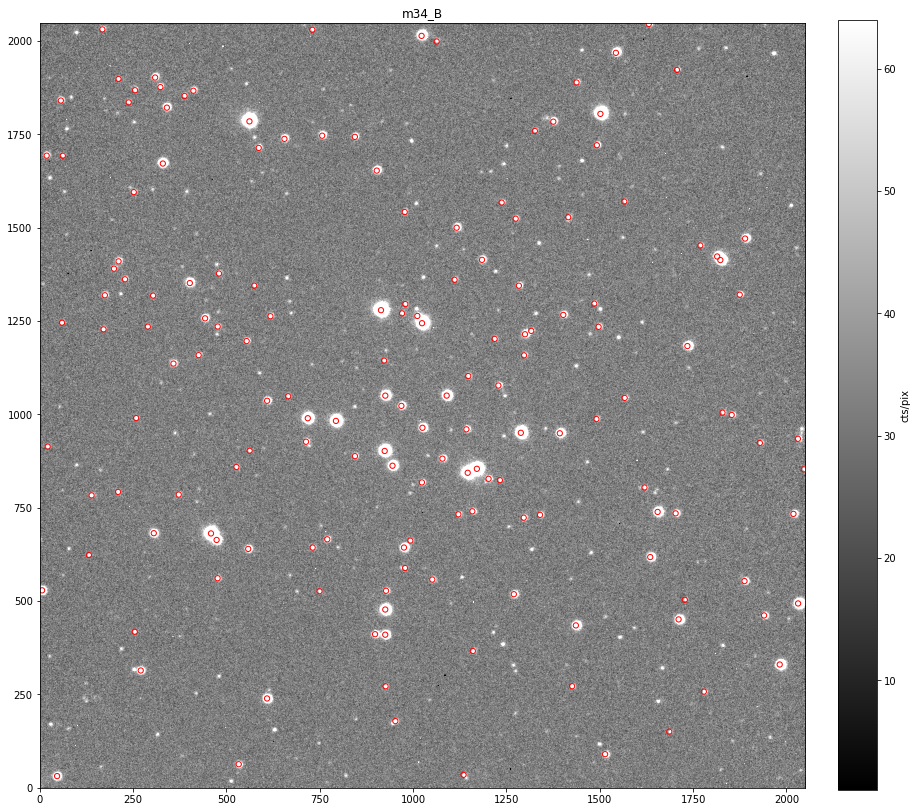

In [5]:

plt.figure(figsize=(15, 15))  # (width, height)
img = plt.imshow(data, 'gist_gray', origin='lower',
                 vmin=mean-(3*std), vmax=mean+(3*std))  # plot image

aps = CircularAperture(positions=positions, r=7)  # create aperture
aps.to_sky(wcs=WCS(header))  # convert to sky coordinates
aps.plot(color='red')  # plot apertures

cbr = plt.colorbar(img, ax=plt.gca(), fraction=0.046, pad=0.04)  # add colorbar
cbr.set_label('cts/pix')  # add label to colorbar
plt.title(filepath[8:13])  # add title


## Perform Aperture Photometry

## Background Subtraction

In [6]:
annulus_aperture = CircularAnnulus(
    positions=positions, r_in=10, r_out=15)  # inner and outer radii
annulus_aperture.to_sky(wcs=WCS(header))  # convert to sky coordinates
annulus_masks = annulus_aperture.to_mask(
    method='center')  # create circular annulus mask
bkg_median = []  # list to hold the median bkg values
for mask in annulus_masks:  # loop over the annulus masks
    annulus_data = mask.multiply(data)  # mask data
    annulus_data_1d = annulus_data[mask.data > 0]  # drop the zeros
    _, median_sigclip, _ = sigma_clipped_stats(
        annulus_data_1d)  # get median and sigma clipped stats
    bkg_median.append(median_sigclip)  # append to list
bkg_median = np.array(bkg_median)  # convert to numpy array
phot = aperture_photometry(data, aps)  # do aperture photometry
phot['annulus_median'] = bkg_median  # add column with median bkg values
phot['aper_bkg'] = bkg_median * aps.area  # add column with background
phot['aper_sum_bkgsub'] = phot['aperture_sum'] - \
    phot['aper_bkg']  # add column with background subtracted
phot_df = phot.to_pandas()
phot_df.head()


,id,xcenter,ycenter,aperture_sum,annulus_median,aper_bkg,aper_sum_bkgsub
0,1,46.410344,30.895804,88924.764291,51.310026,7898.564862,81026.199429
1,2,1134.965524,34.167469,9941.275787,35.335009,5439.401971,4501.873816
2,3,532.989372,62.640426,30215.936915,38.536169,5932.182334,24283.754581
3,4,1514.231150,89.589240,34905.053944,38.936203,5993.762776,28911.291168
4,5,1686.033854,149.982055,8564.097366,33.031387,5084.787025,3479.310341


# Error Estimation

In [7]:
# TODO
# see https://photutils.readthedocs.io/en/stable/api/photutils.utils.calc_total_error.html#photutils.utils.calc_total_error
# determine bkg_error and effective gain of the scope
# error = calc_total_error(data, bkg_error, effective_gain) 
# phot = aperture_photometry(data - bkg, aperture, error=error)  

All of the cells above show a walkthrough of the process of determining photometric values for one image. Below is a modular approach to quickly do that same process for all four of our images.

Set OBSGEO-Y to -4721096.211 from OBSGEO-[LBH].
Set OBSGEO-Z to  4079367.987 from OBSGEO-[LBH]'. [astropy.wcs.wcs]
Set OBSGEO-Y to -4721096.211 from OBSGEO-[LBH].
Set OBSGEO-Z to  4079367.987 from OBSGEO-[LBH]'. [astropy.wcs.wcs]
Set OBSGEO-Y to -4721096.211 from OBSGEO-[LBH].
Set OBSGEO-Z to  4079367.987 from OBSGEO-[LBH]'. [astropy.wcs.wcs]
Set OBSGEO-Y to -4721096.211 from OBSGEO-[LBH].
Set OBSGEO-Z to  4079367.987 from OBSGEO-[LBH]'. [astropy.wcs.wcs]


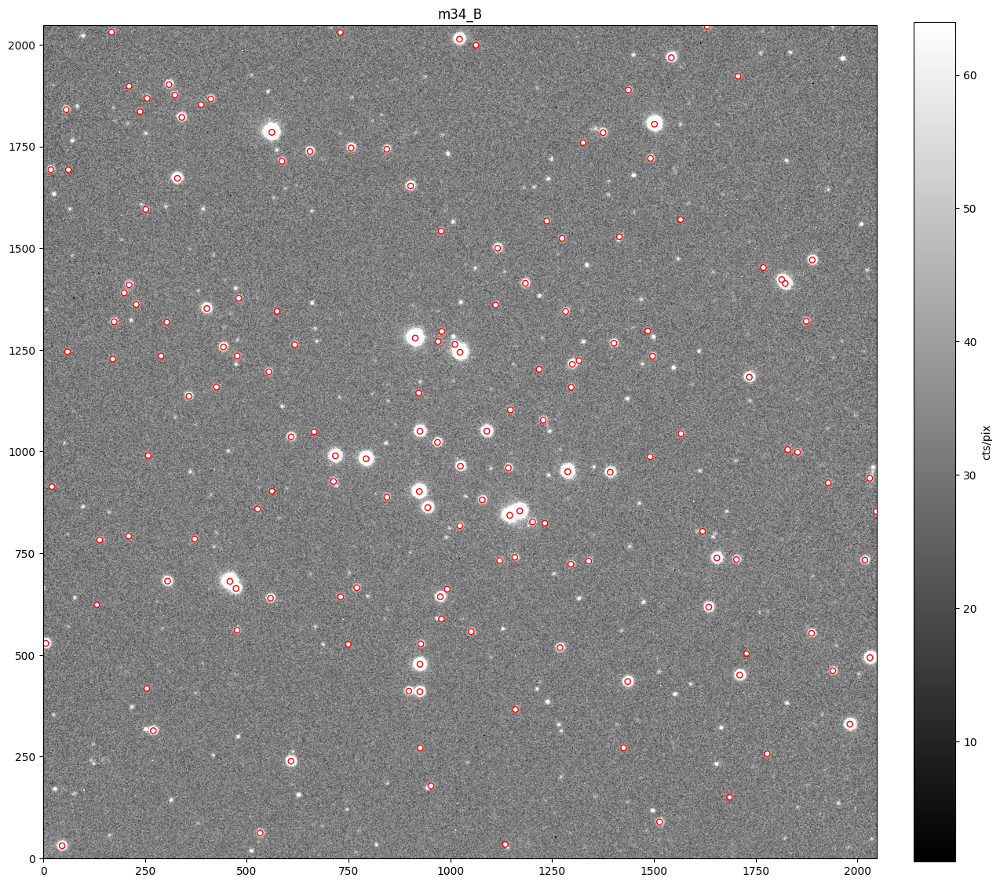

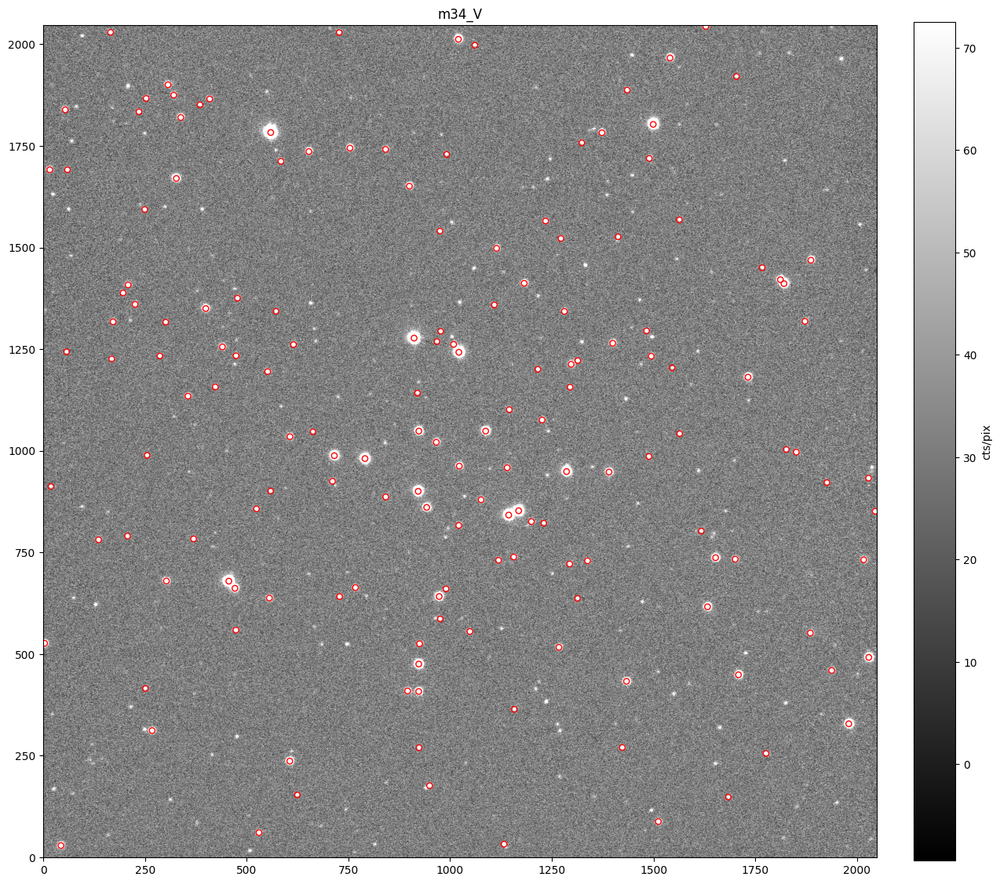

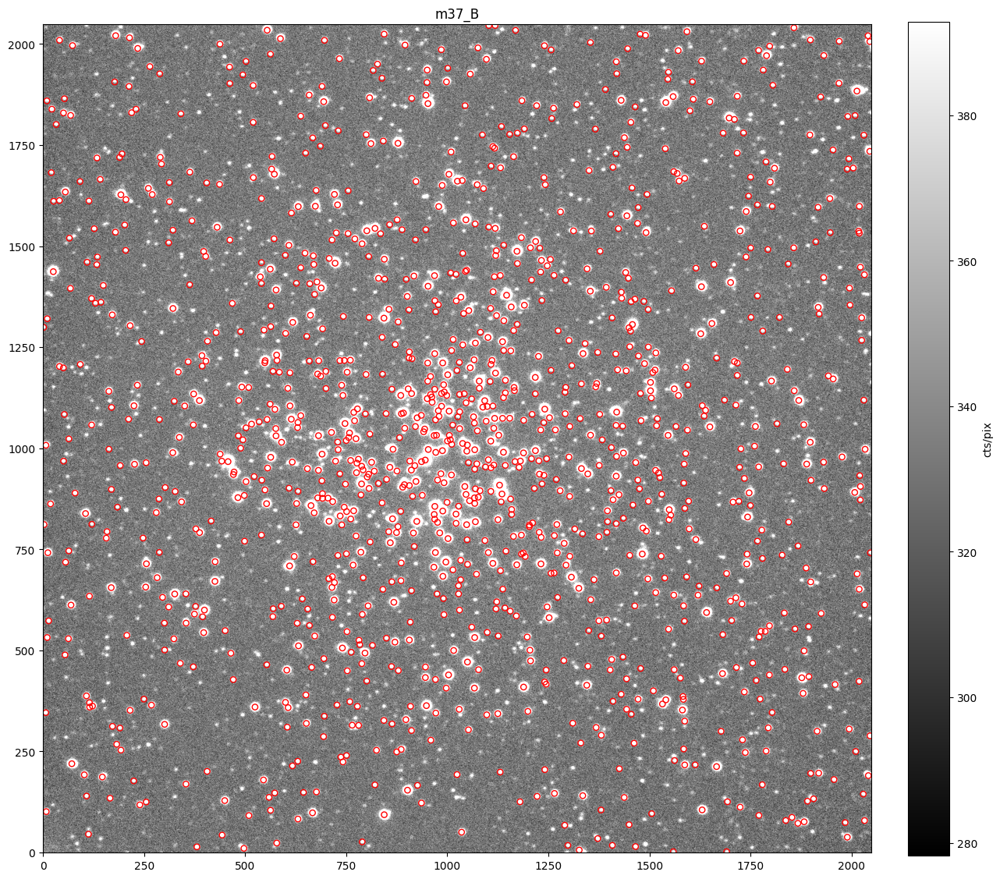

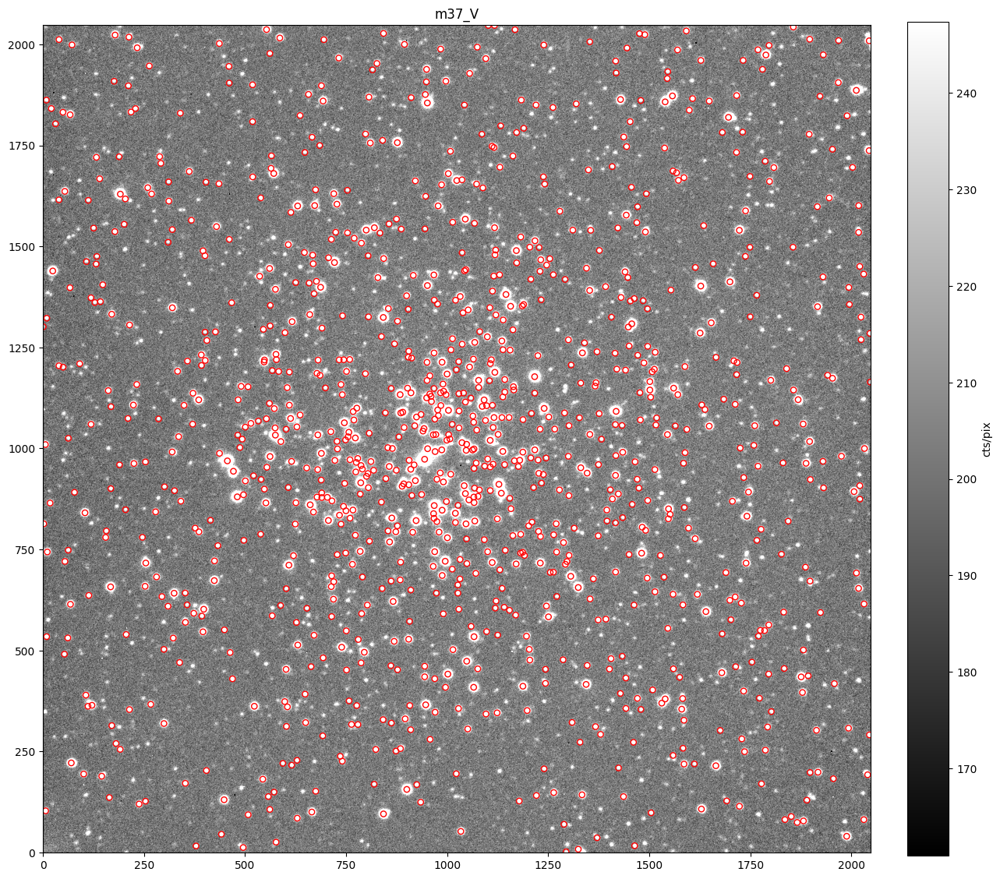

In [19]:
file_paths = ['masters/m34_B_master.fits',
              'masters/m34_V_master.fits',
              'masters/m37_B_master.fits',
              'masters/m37_V_master.fits']
phot_tables = []
for filepath in file_paths:
    header = fits.open(filepath)[0].header  # get header
    data = fits.open(filepath)[0].data  # get data
    mean, median, std = sigma_clipped_stats(data, sigma=3.0)  # get stats
    bkg_estimator = SExtractorBackground()  # get bkg estimator
    bkg = bkg_estimator(data)  # get bkg

    daofind = DAOStarFinder(fwhm=7, threshold=10*std)  # get DAOStarFinder
    sources = daofind(data - bkg)  # get sources
    sources_df = sources.to_pandas()  # get sources as pandas dataframe
    positions = [list(a)
                 for a in zip(sources["xcentroid"], sources["ycentroid"])]   # get positions

    plt.figure(figsize=(15, 15))  # set plot size
    img = plt.imshow(data, 'gist_gray', origin='lower',
                     vmin=mean-(3*std), vmax=mean+(3*std))  # plot image

    aps = CircularAperture(positions=positions, r=7)  # get apertures
    aps_sky = aps.to_sky(wcs=WCS(header))  # convert to sky coordinates
    aps.plot(color='red')  # plot apertures
    cbr = plt.colorbar(img, ax=plt.gca(), fraction=0.046,
                       pad=0.04)  # get colorbar
    cbr.set_label('cts/pix')  # set colorbar label
    plt.title(filepath[8:13])  # set plot title
    plt.savefig(filepath[8:13] + "_sources.png", dpi=300)  # save plot

    annulus_aperture = CircularAnnulus(
        positions=positions, r_in=10, r_out=15)  # get annulus apertures
    annulus_aperture_sky = annulus_aperture.to_sky(
        wcs=WCS(header))  # convert to sky coordinates
    annulus_masks = annulus_aperture.to_mask(
        method='center')  # get annulus masks
    bkg_median = []  # a list to store bkg_median
    for mask in annulus_masks:  # loop through masks
        annulus_data = mask.multiply(data)  # get annulus data
        # get annulus data as 1d array
        annulus_data_1d = annulus_data[mask.data > 0]
        _, median_sigclip, _ = sigma_clipped_stats(
            annulus_data_1d)  # get median and sigma clipped stats
        bkg_median.append(median_sigclip)  # append median to list
    bkg_median = np.array(bkg_median)  # convert list to array
    phot = aperture_photometry(data, aps)  # get photometry
    phot['annulus_median'] = bkg_median  # add bkg_median to photometry
    phot['aper_bkg'] = bkg_median * aps.area  # get bkg
    phot['aper_sum_bkgsub'] = phot['aperture_sum'] - \
        phot['aper_bkg']  # get bkg subtracted sum
    phot_df = phot.to_pandas()
    phot_tables.append(phot_df)
    # error = calc_total_error(data, bkg_error, effective_gain)
    # phot = aperture_photometry(data - bkg, aperture, error=error)


In [20]:

m34_B_fluxes = phot_tables[0]['aper_sum_bkgsub']
m34_V_fluxes = phot_tables[1]['aper_sum_bkgsub']
m37_B_fluxes = phot_tables[2]['aper_sum_bkgsub']
m37_V_fluxes = phot_tables[3]['aper_sum_bkgsub']



(-98.7311115321864, 2148.6083526523093, -71.7751370354249, 2146.085071666839)

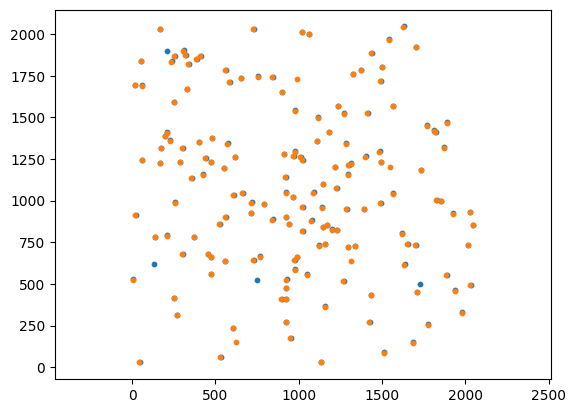

In [31]:
plt.style.use("default")
m34_B_50_largest = phot_tables[0]#.nlargest(150, 'aper_sum_bkgsub')
m34_V_50_largest = phot_tables[1]#.nlargest(150, 'aper_sum_bkgsub')
plt.scatter(m34_B_50_largest['xcenter'], m34_B_50_largest['ycenter'], s = 10)
plt.scatter(m34_V_50_largest['xcenter'], m34_V_50_largest['ycenter'], s = 10)
plt.axis('equal')